In [2]:
from ucimlrepo import fetch_ucirepo 
import pandas as pd
import seaborn as sns
import sklearn
import math
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA

In [3]:

# fetch dataset 
bank_marketing = fetch_ucirepo(id=222) 
  
# data (as pandas dataframes) 
x = bank_marketing.data.features 
y = bank_marketing.data.targets 
df = bank_marketing.data.original
# metadata
print(bank_marketing.metadata)
  
# variable information 
print(bank_marketing.variables.head())
print('\nx head\n', x.head(10))
print('\nx tail\n', x.head(10))

print('\ny head\n', y.head(10))


{'uci_id': 222, 'name': 'Bank Marketing', 'repository_url': 'https://archive.ics.uci.edu/dataset/222/bank+marketing', 'data_url': 'https://archive.ics.uci.edu/static/public/222/data.csv', 'abstract': 'The data is related with direct marketing campaigns (phone calls) of a Portuguese banking institution. The classification goal is to predict if the client will subscribe a term deposit (variable y).', 'area': 'Business', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 45211, 'num_features': 16, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Age', 'Occupation', 'Marital Status', 'Education Level'], 'target_col': ['y'], 'index_col': None, 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 2014, 'last_updated': 'Fri Aug 18 2023', 'dataset_doi': '10.24432/C5K306', 'creators': ['S. Moro', 'P. Rita', 'P. Cortez'], 'intro_paper': {'title': 'A data-driven approach to predict the success of bank telemarketing'

C:\Users\Mahmoud Hisham\AppData\Local\Temp\ipykernel_18480\637929982.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y.dropna(inplace=True)


Shape (45211, 17)
Shape (45211, 17)
Number of non NAN Values of column : age            45211
job            44923
marital        45211
education      43354
default        45211
balance        45211
housing        45211
loan           45211
contact        32191
day_of_week    45211
month          45211
duration       45211
campaign       45211
pdays          45211
previous       45211
poutcome        8252
y              45211
dtype: int64
Shape (45211, 17)


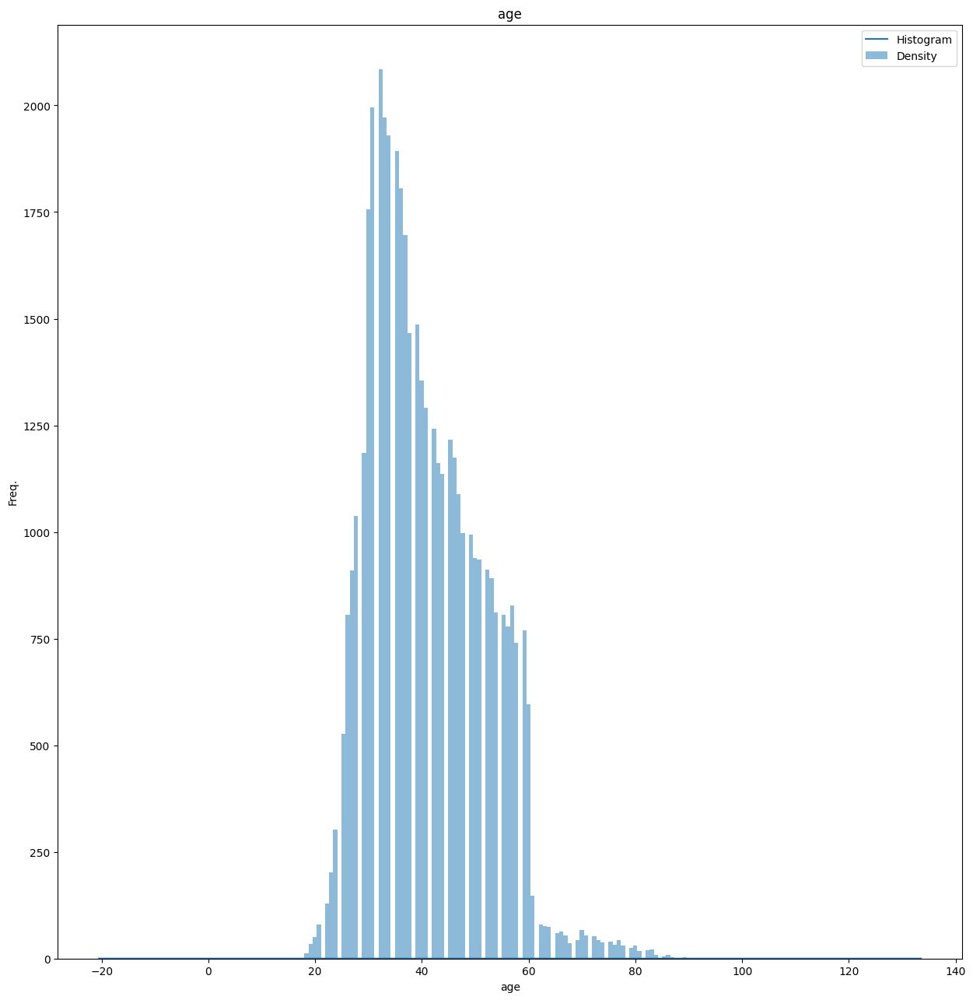

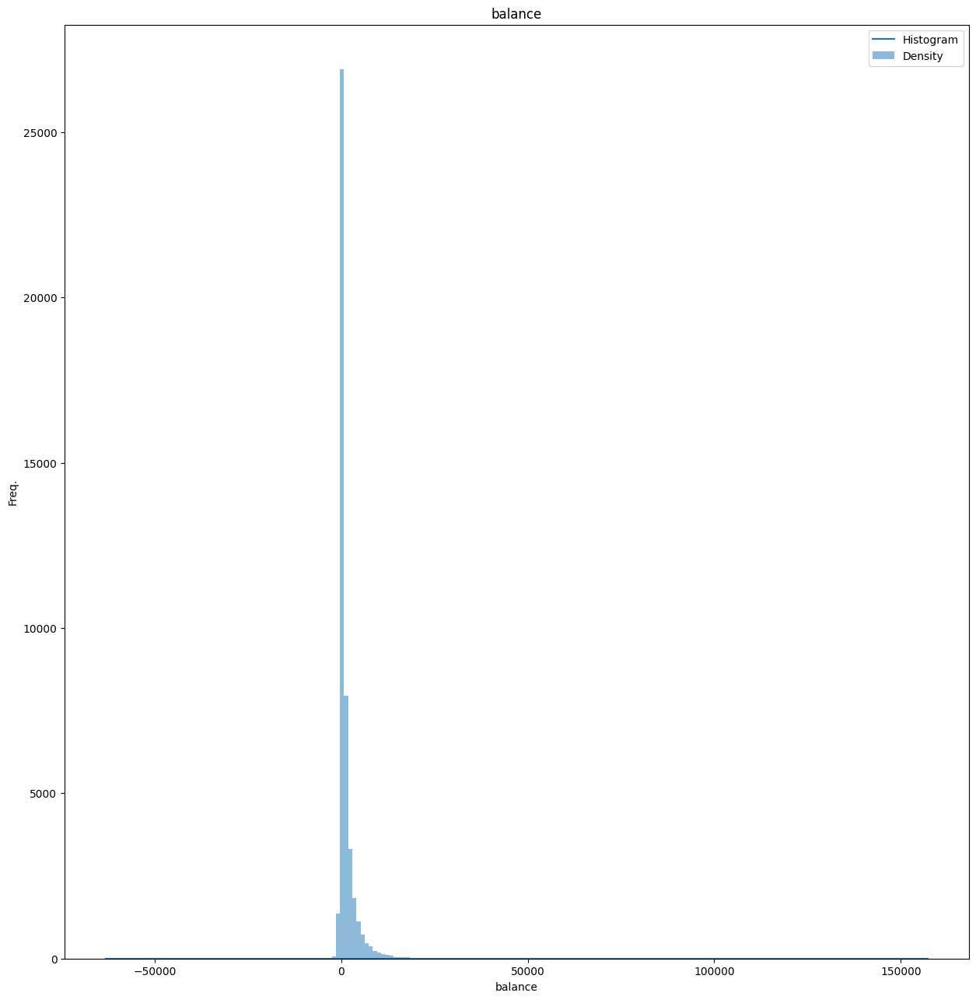

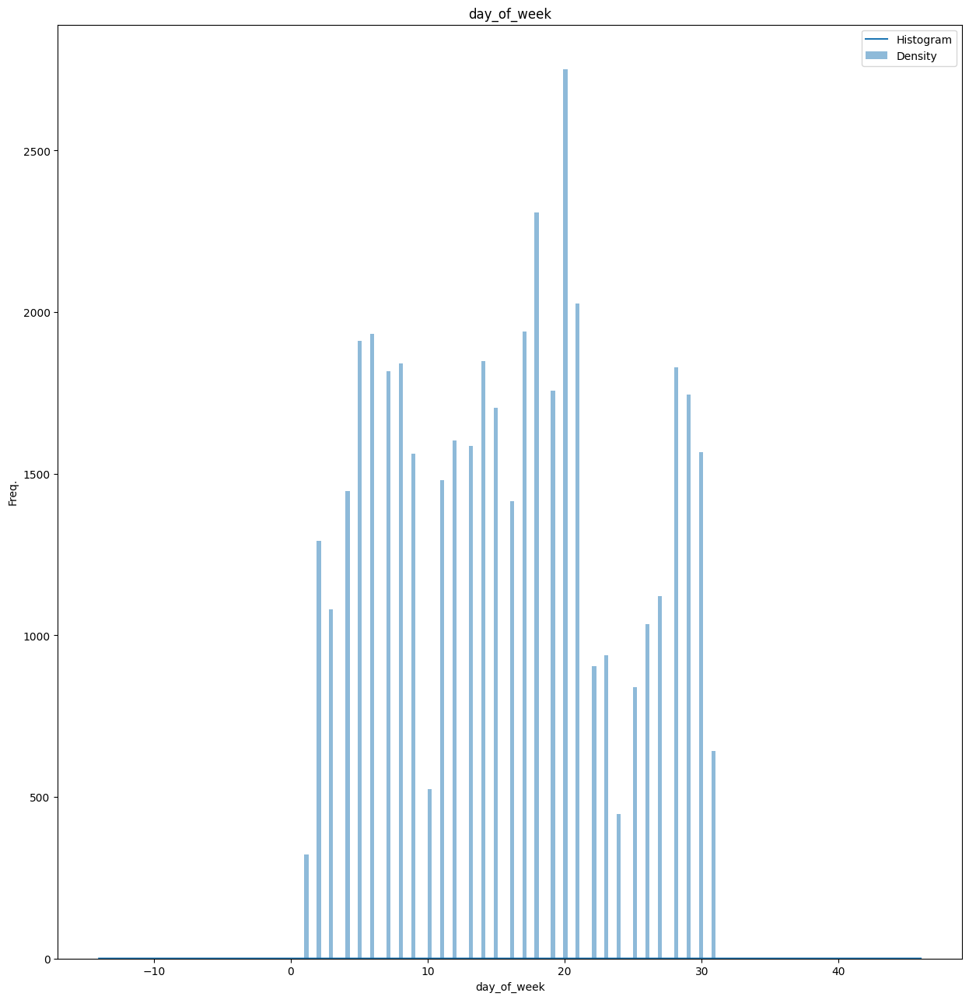

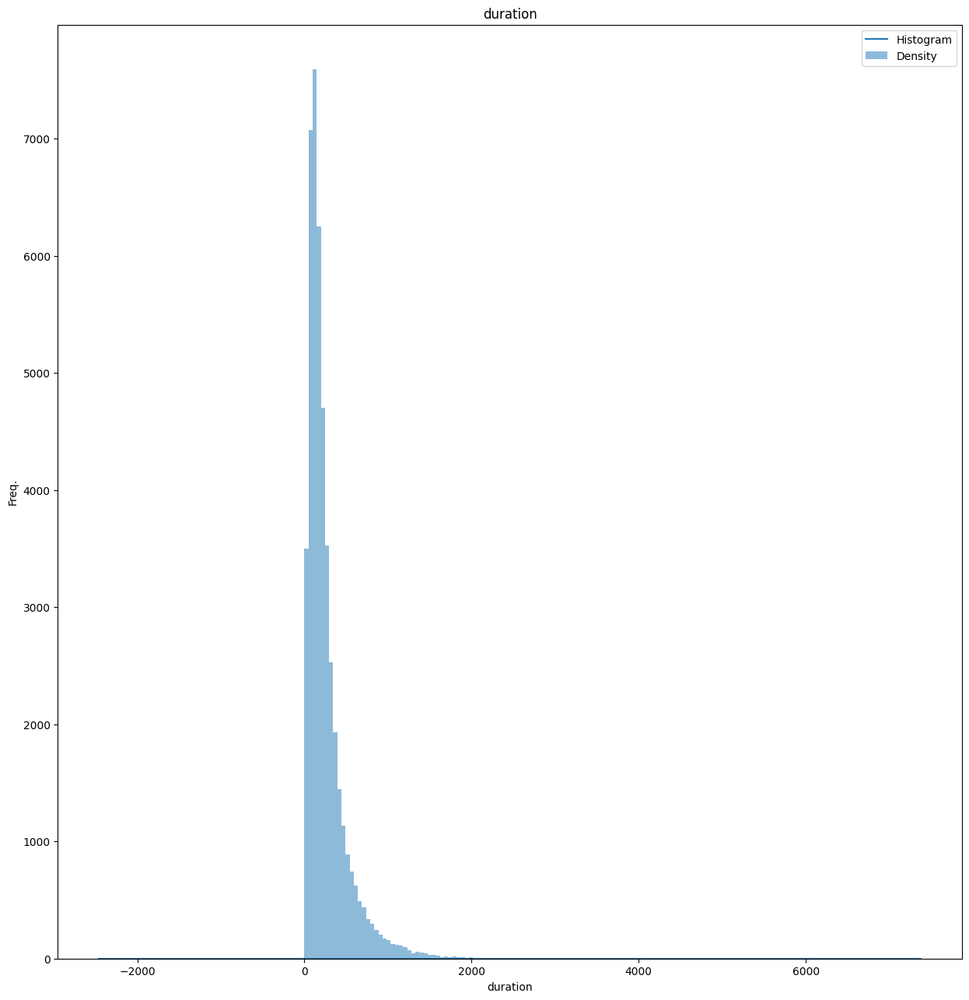

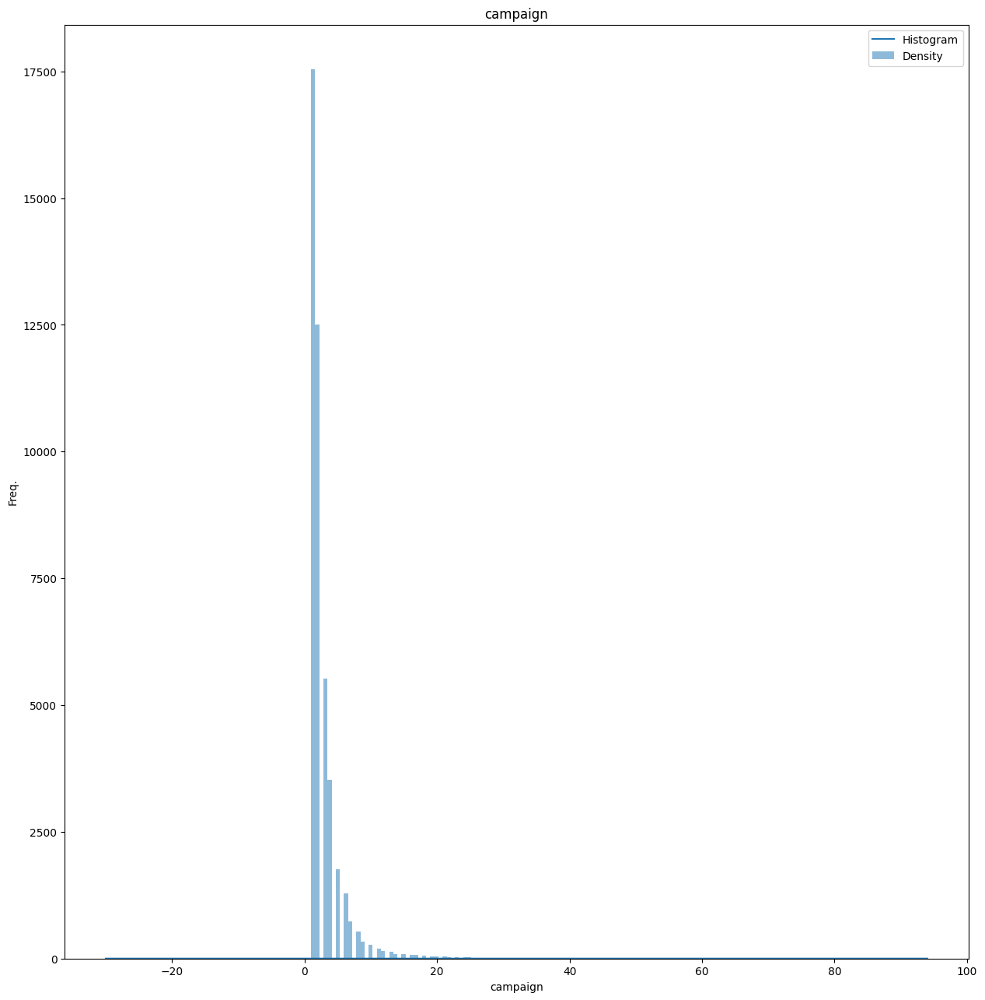

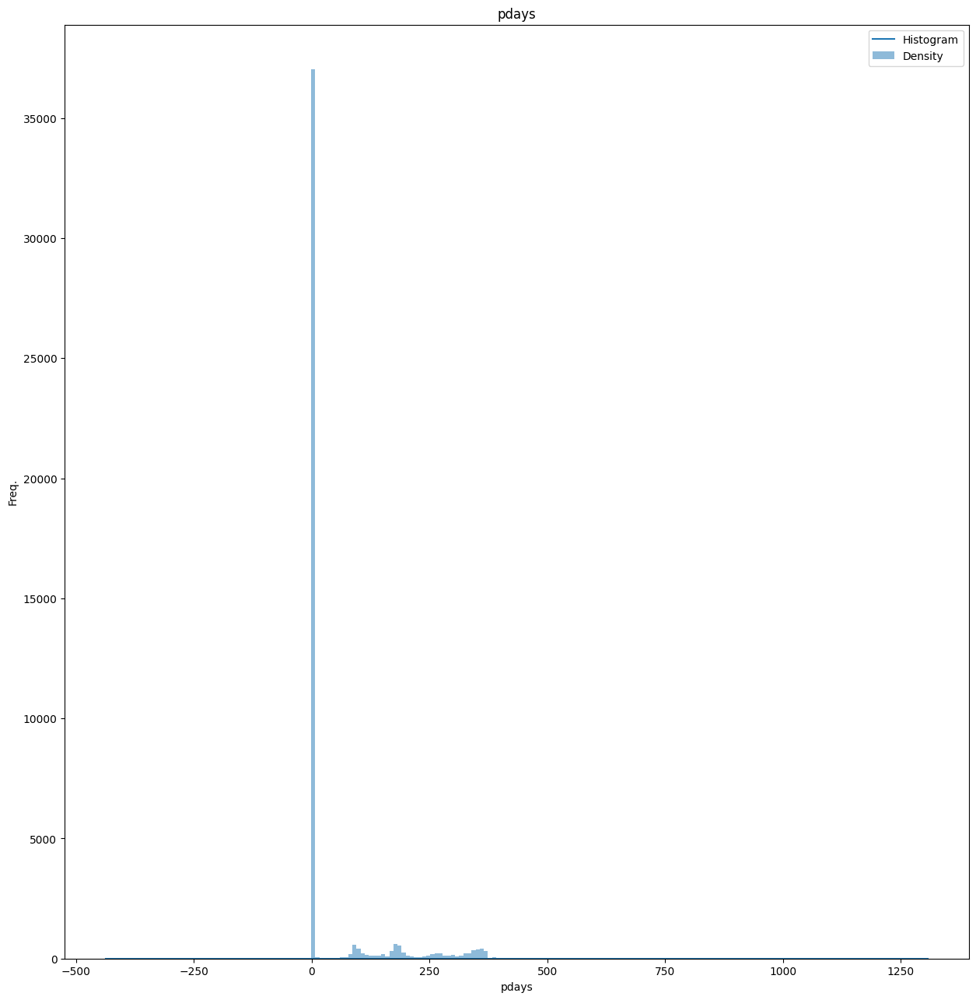

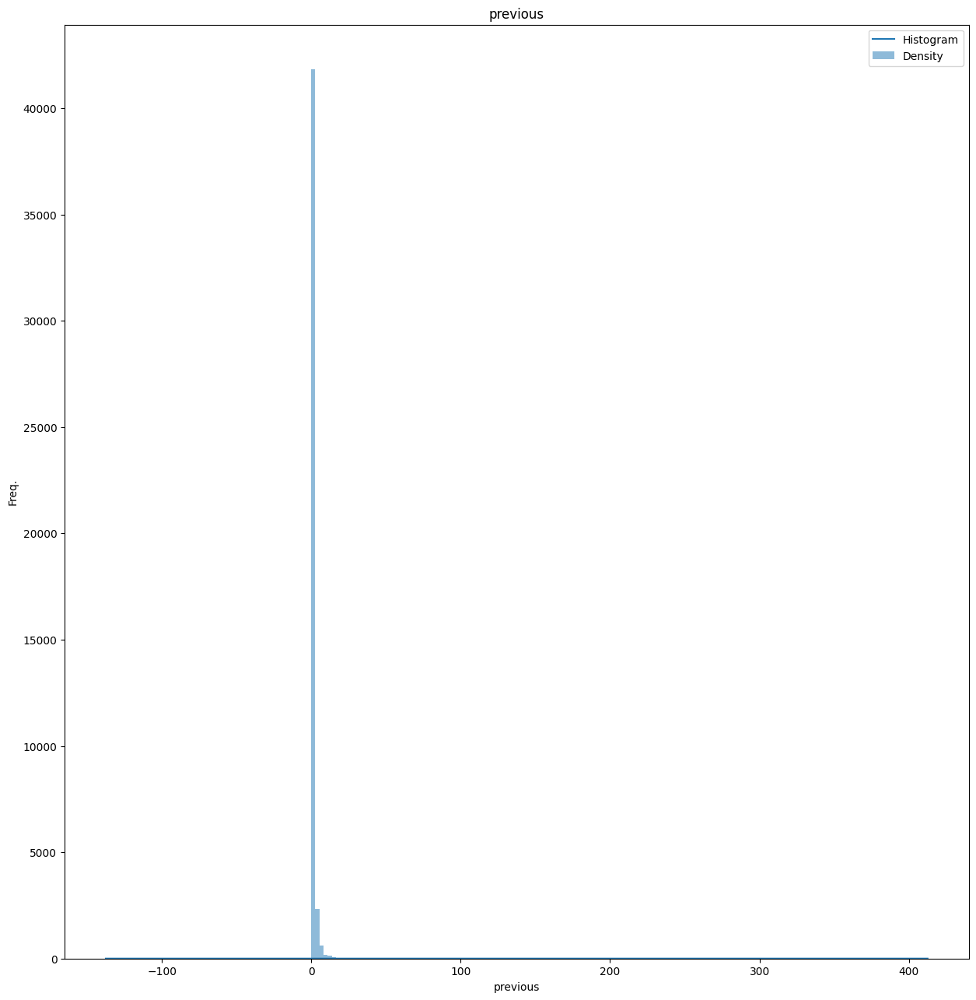

In [4]:
numeric_columns = []
for column in df.columns:
    if pd.api.types.is_numeric_dtype(df[column]):
        numeric_columns.append(column)
        # plt.margins(5, 5)
        plt.figure(figsize=(15,15))
        plt.subplots_adjust(top=0.9, bottom=0.1, wspace=5)
        df[column].hist(alpha=0.5, bins=100)
        if (df[column].nunique()) > 10:
            df[column].plot(kind='density', subplots=True, sharex=False)
        plt.title(column)
        plt.xlabel(column)
        plt.ylabel('Freq.')
        if df[column].nunique() > 10:
            plt.legend(['Histogram', 'Density'])
        else:
            plt.legend(['Histogram'])


df.dropna(subset = y.columns, inplace = True)
y.dropna(inplace=True)
print('Shape', df.shape)
catgeorical_columns = []
numeric_columns = []
for column in x.columns:
    if pd.api.types.is_numeric_dtype(df[column]):
        numeric_columns.append(column)
    else:
        catgeorical_columns.append(column)


print('Shape', df.shape)
print('Number of non NAN Values of column :', df.notna().sum())
print('Shape', df.shape)
plt.show()

In [5]:
df.drop(['contact', 'poutcome', 'duration'], axis = 1, inplace=True)

In [6]:
df.dropna(inplace=True)
x.dropna(inplace=True)
print(df.head())
numeric_df = df.select_dtypes(include="number")

   age           job  marital  education default  balance housing loan  \
0   58    management  married   tertiary      no     2143     yes   no   
1   44    technician   single  secondary      no       29     yes   no   
2   33  entrepreneur  married  secondary      no        2     yes  yes   
5   35    management  married   tertiary      no      231     yes   no   
6   28    management   single   tertiary      no      447     yes  yes   

   day_of_week month  campaign  pdays  previous   y  
0            5   may         1     -1         0  no  
1            5   may         1     -1         0  no  
2            5   may         1     -1         0  no  
5            5   may         1     -1         0  no  
6            5   may         1     -1         0  no  


C:\Users\Mahmoud Hisham\AppData\Local\Temp\ipykernel_18480\3237095446.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x.dropna(inplace=True)


<Figure size 640x480 with 0 Axes>

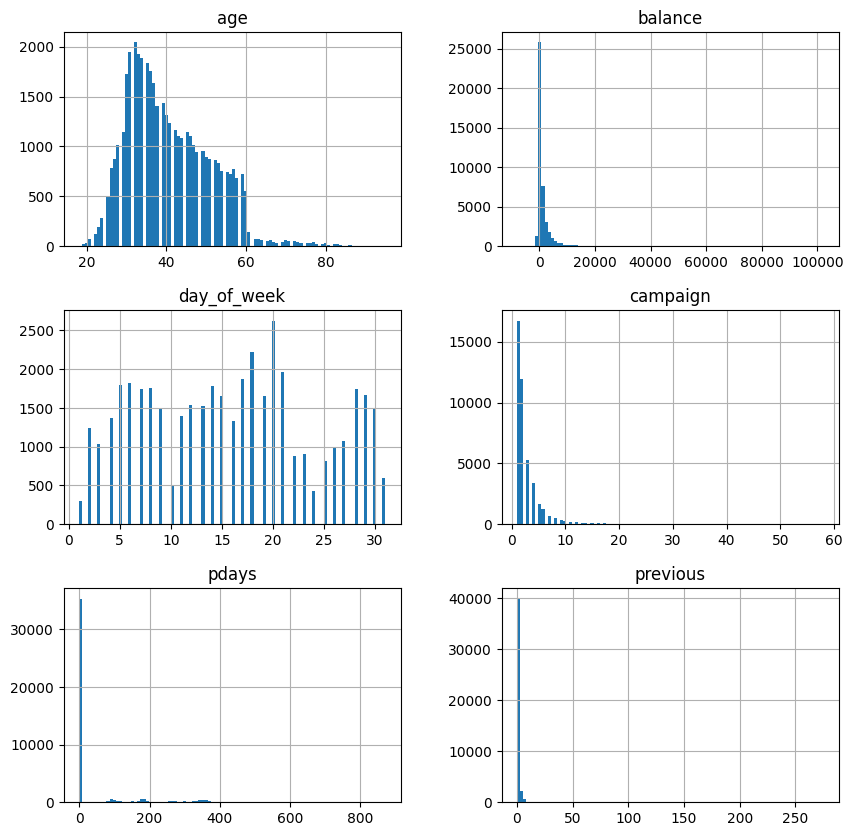

<Figure size 640x480 with 0 Axes>

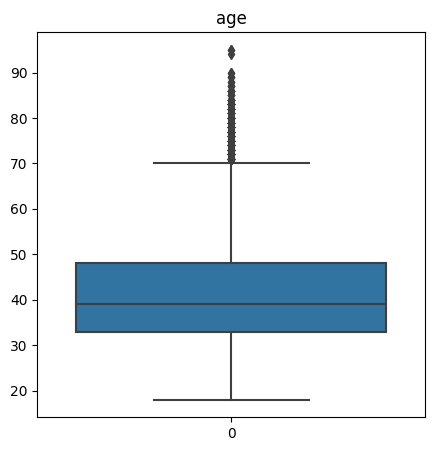

<Figure size 640x480 with 0 Axes>

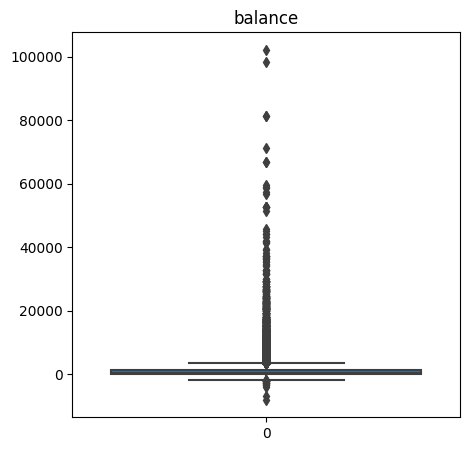

<Figure size 640x480 with 0 Axes>

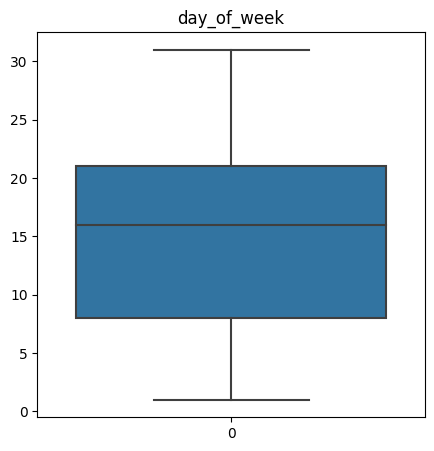

<Figure size 640x480 with 0 Axes>

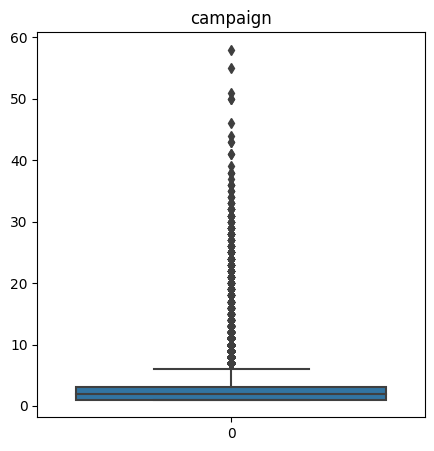

<Figure size 640x480 with 0 Axes>

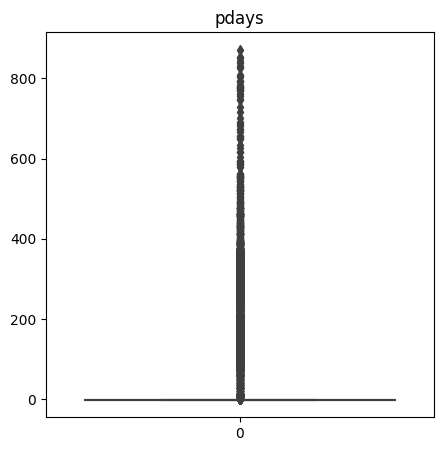

<Figure size 640x480 with 0 Axes>

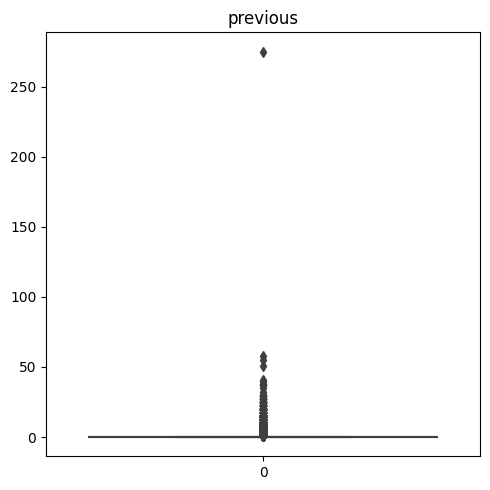

In [7]:
def removal_box_plot(df, column, threshold):
    sns.boxplot(df[column])
    plt.title(f'Original Box Plot of {column}')
    plt.show()
 
    removed_outliers = df[df[column] <= threshold]
 
    sns.boxplot(removed_outliers[column])
    plt.title(f'Box Plot without Outliers of {column}')
    plt.show()
    return removed_outliers

numeric_columns = []
for column in df.columns:
    if pd.api.types.is_numeric_dtype(df[column]):
        numeric_columns.append(column)

plt.subplots_adjust(top=0.9, bottom=0.1, wspace=5)
df[numeric_columns].hist(figsize=(10,10), bins=100)

for i, column in enumerate(df.columns):
    if pd.api.types.is_numeric_dtype(df[column]):
        plt.figure()
        fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(5, 5)) 

        sns.boxplot(df[column], ax=axes)
        axes.set_title(column)

plt.tight_layout()
plt.show()

In [8]:
for column in df.columns:
    if pd.api.types.is_numeric_dtype(df[column]):
        if column not in ['previous', 'pdays']:
            Q1 = df[column].quantile(0.25)
            Q3 = df[column].quantile(0.75)
            IQR = Q3 - Q1
            lower = Q1 - 1.5*IQR
            upper = Q3 + 1.5*IQR
            upper_array = np.where(df[column] >= upper)[0]
            lower_array = np.where(df[column] <= lower)[0]
            upper_array = [idx for idx in upper_array if idx in df.index]
            lower_array = [idx for idx in lower_array if idx in df.index]
            df = df[(df[column] >= lower) & (df[column] <= upper)]
            print(df.shape)

(42759, 14)
(38253, 14)
(38253, 14)
(35651, 14)


<Figure size 640x480 with 0 Axes>

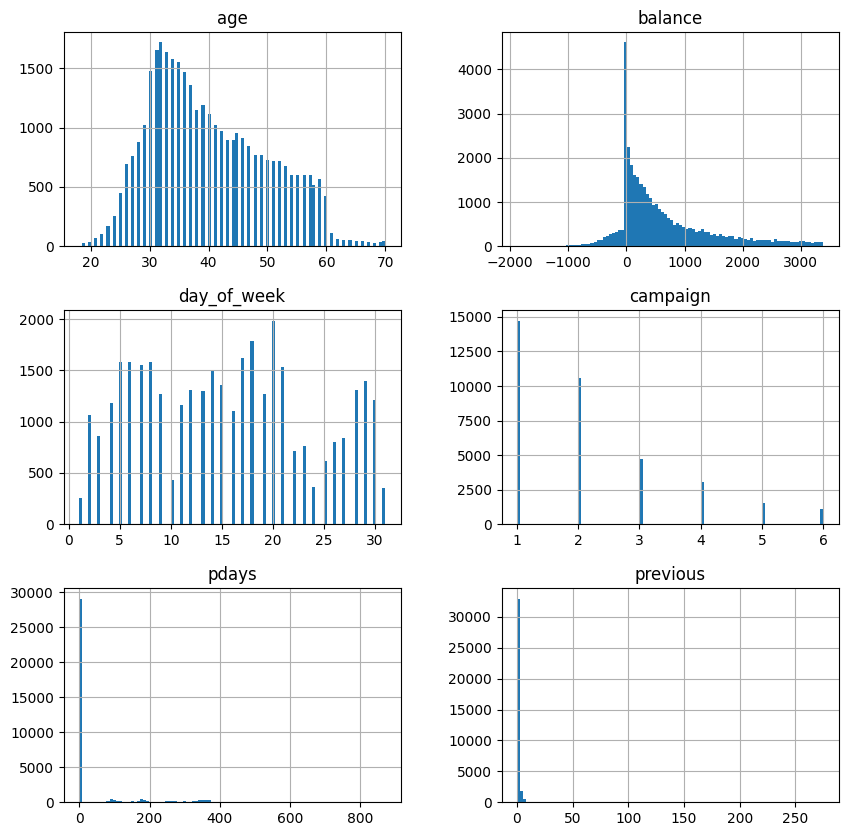

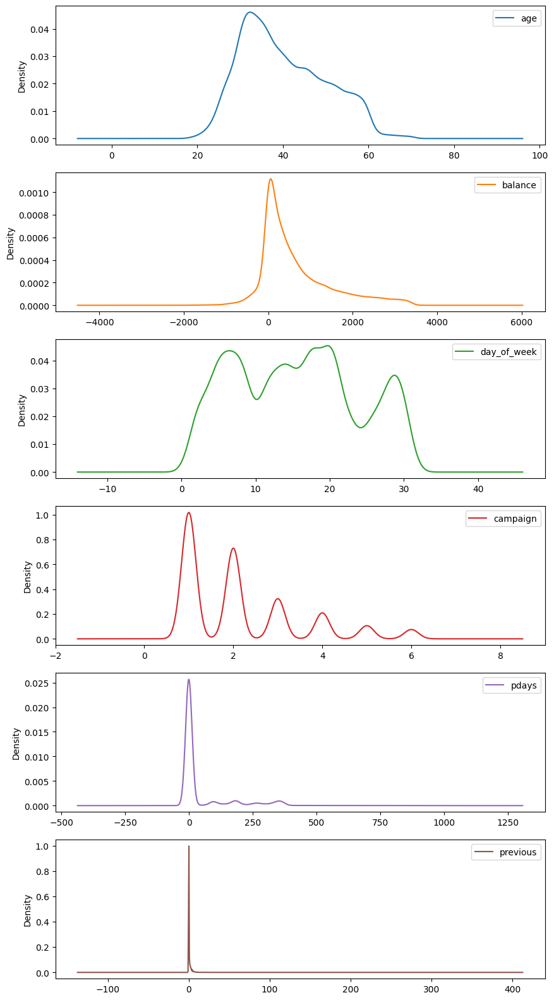

In [9]:
numeric_columns = []
for column in df.columns:
    if pd.api.types.is_numeric_dtype(df[column]):
        numeric_columns.append(column)
plt.subplots_adjust(top=0.9, bottom=0.1, wspace=5)
df[numeric_columns].hist(figsize=(10,10), bins=100)
df[numeric_columns].plot(kind='density', subplots=True, sharex=False, figsize=(10,20))
plt.show()

In [10]:
df.head()

,age,job,marital,education,default,balance,housing,loan,day_of_week,month,campaign,pdays,previous,y
0,58,management,married,tertiary,no,2143,yes,no,5,may,1,-1,0,no
1,44,technician,single,secondary,no,29,yes,no,5,may,1,-1,0,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,5,may,1,-1,0,no
5,35,management,married,tertiary,no,231,yes,no,5,may,1,-1,0,no
6,28,management,single,tertiary,no,447,yes,yes,5,may,1,-1,0,no


C:\Users\Mahmoud Hisham\AppData\Local\Temp\ipykernel_18480\621126171.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True)


<AxesSubplot: >

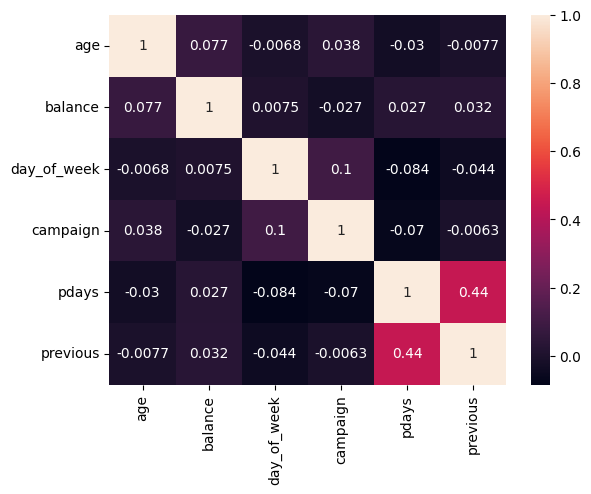

In [11]:
sns.heatmap(df.corr(), annot=True)

campaign


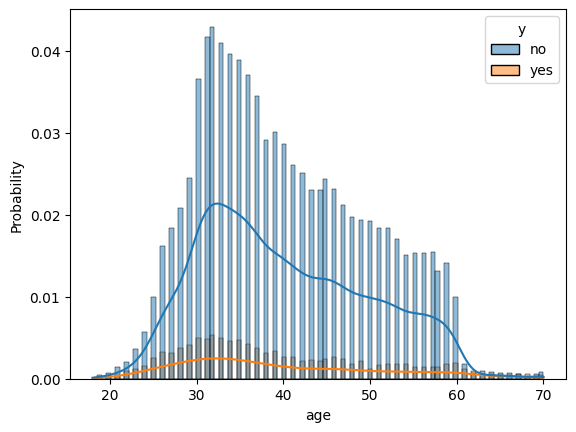

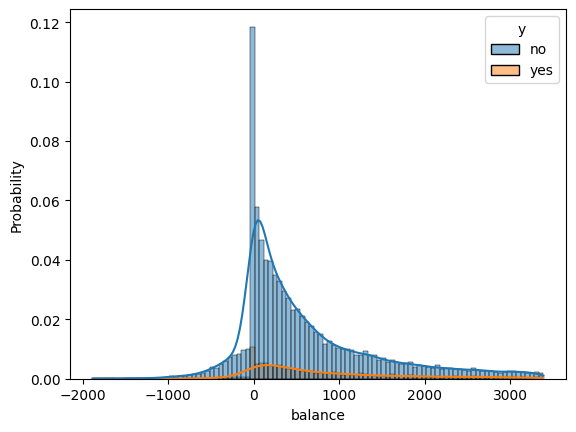

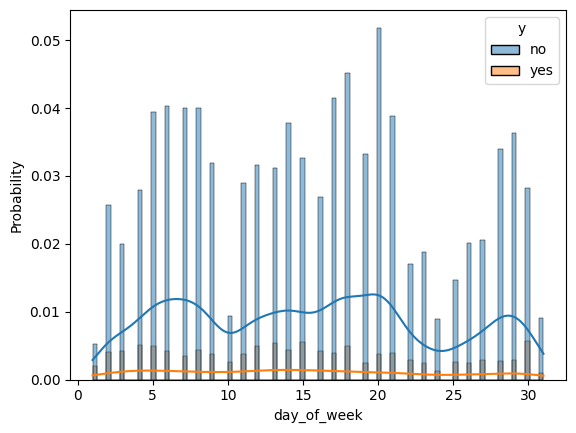

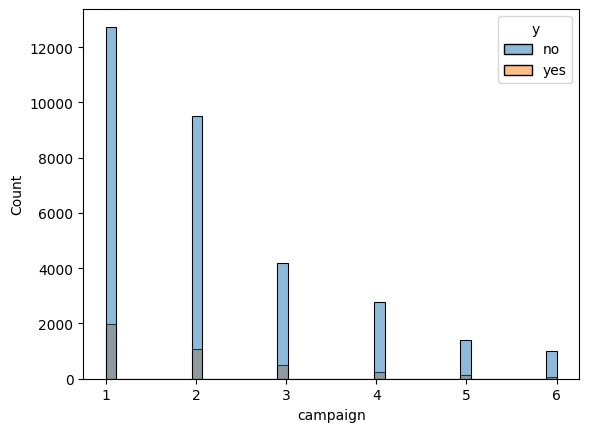

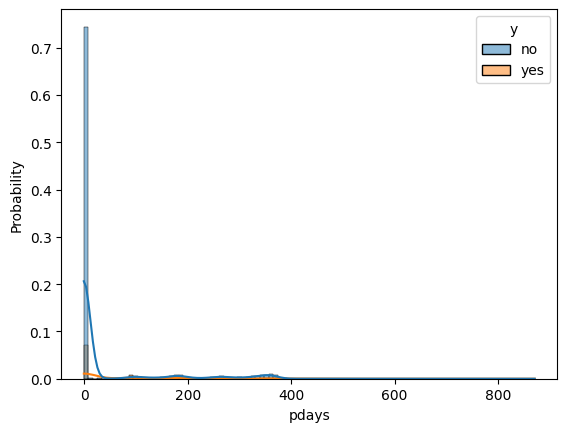

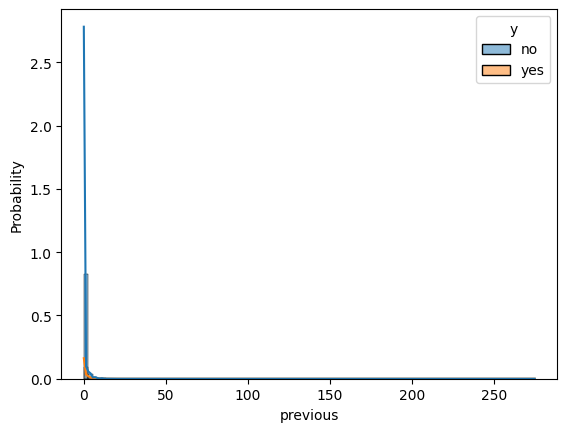

In [12]:
for column in numeric_columns:
    if df[column].nunique() > 10:
        plt.figure()
        sns.histplot(data = df, x = column, stat = "probability", kde = True, hue = "y", bins=100)
    else:
        plt.figure()
        print(column)
        sns.histplot(data = df, x = column, hue = "y")

c:\Users\Mahmoud Hisham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:447: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


0         no
1         no
2         no
5         no
6         no
        ... 
45203    yes
45205    yes
45206    yes
45209     no
45210     no
Name: y, Length: 35651, dtype: object

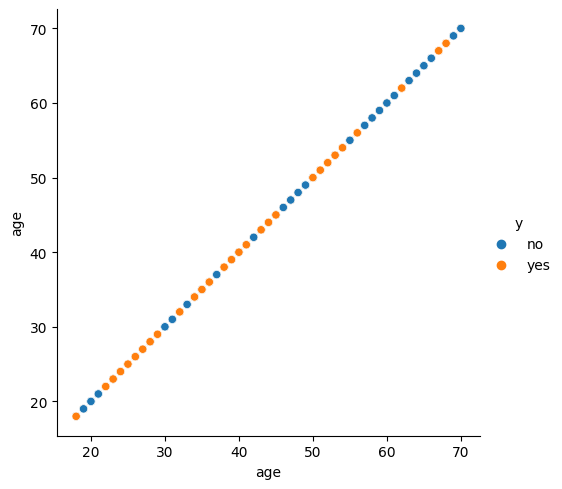

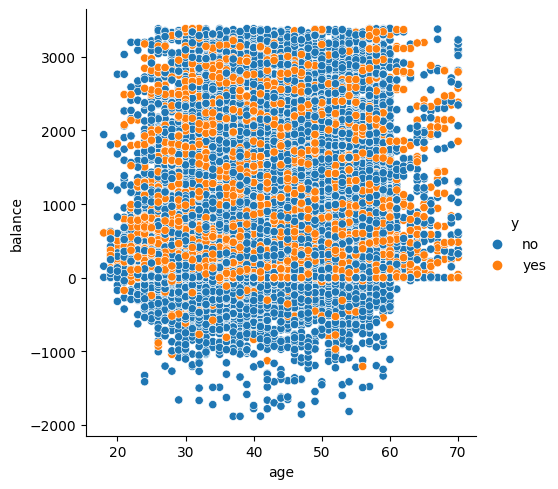

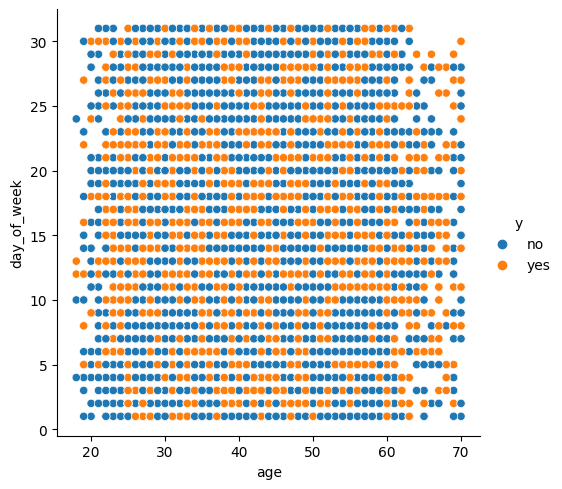

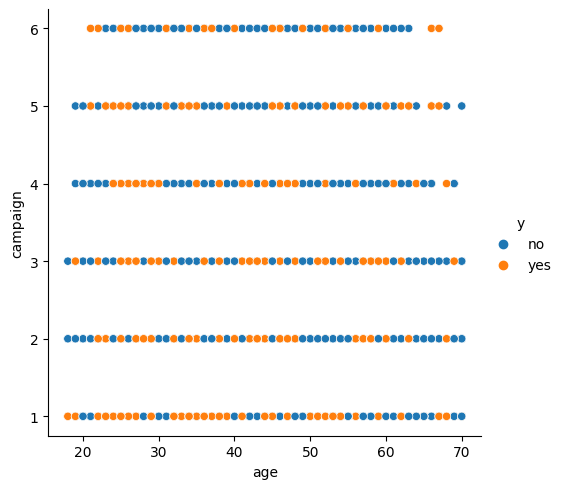

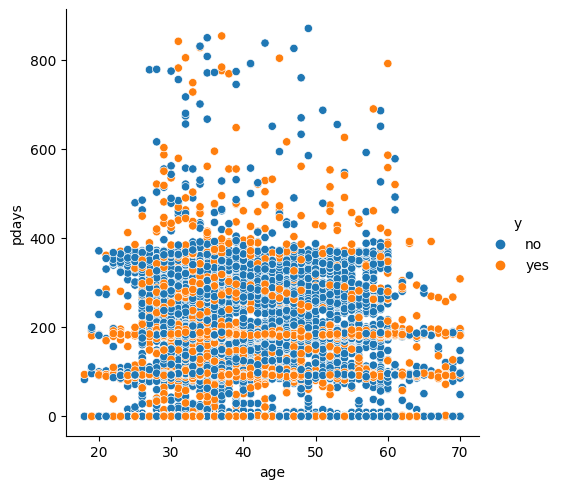

...

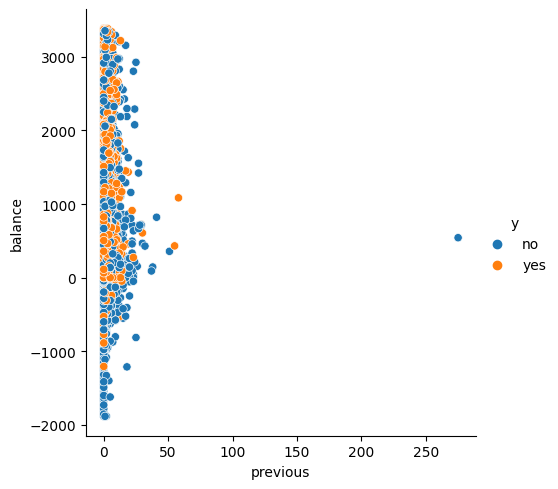

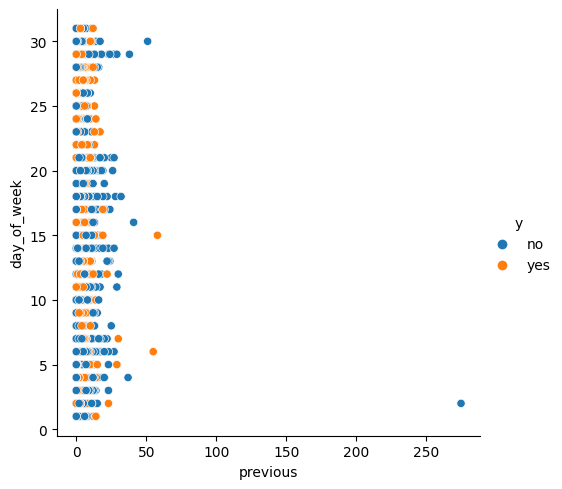

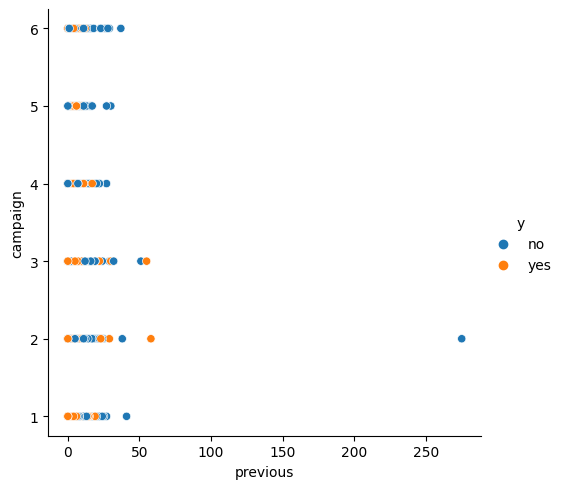

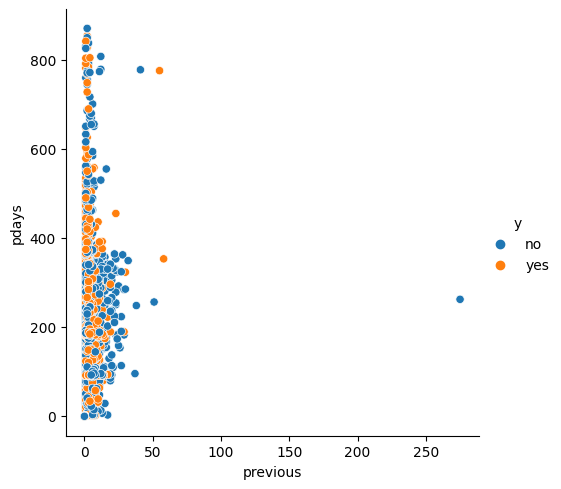

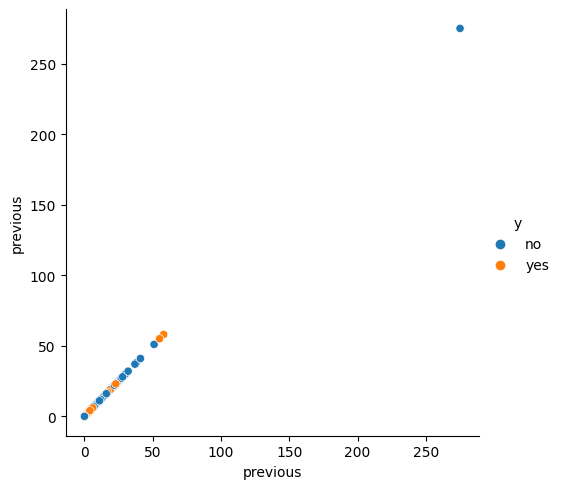

In [13]:
df_encoded_target = df.copy()
for column in numeric_columns:   
    for column_2 in numeric_columns:     
        sns.relplot(
            data=df,
            x=column, y=column_2, hue="y"
        )

df_encoded_target['y']

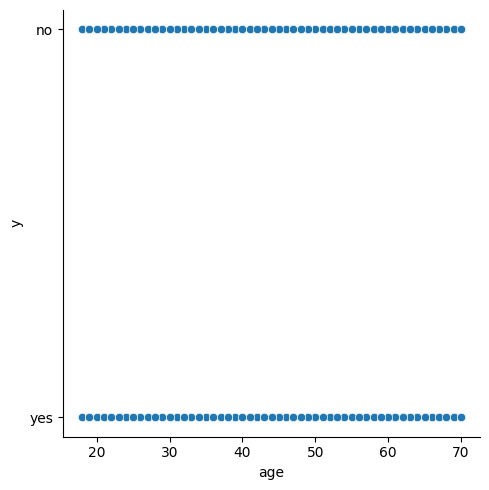

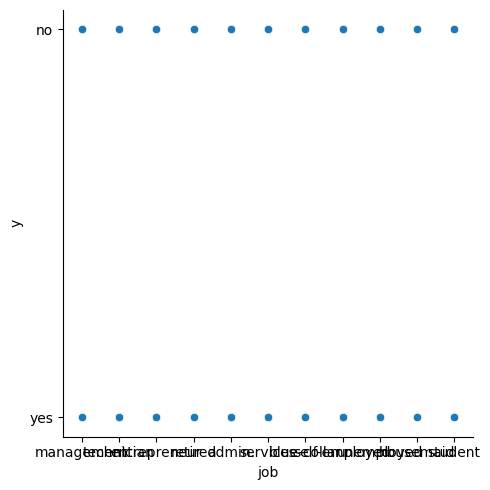

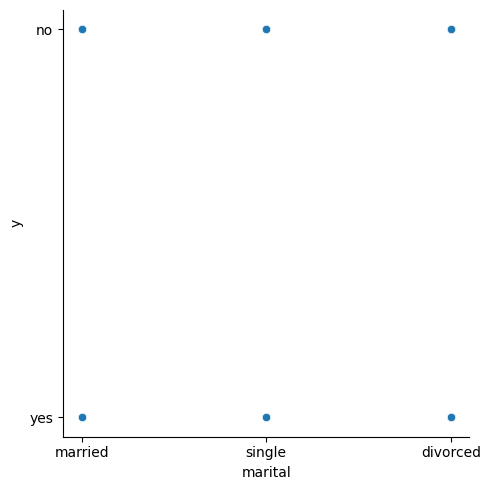

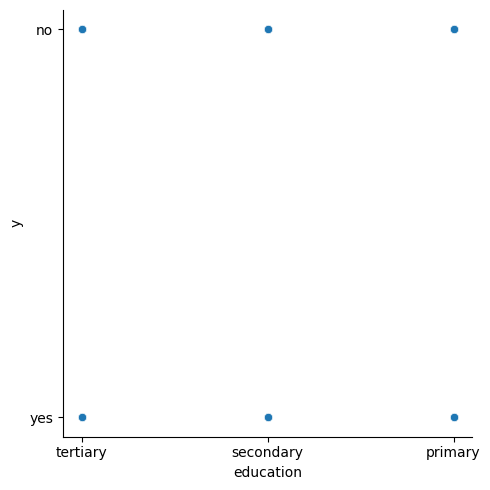

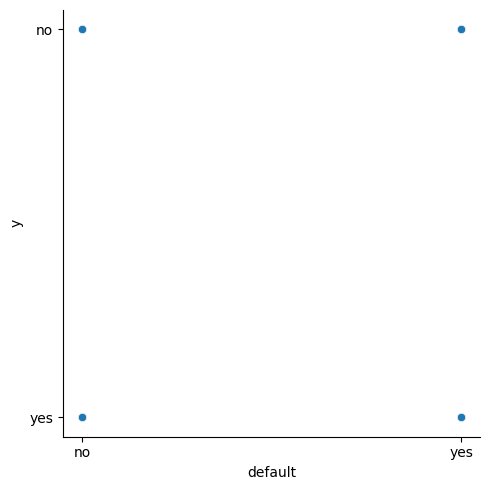

...

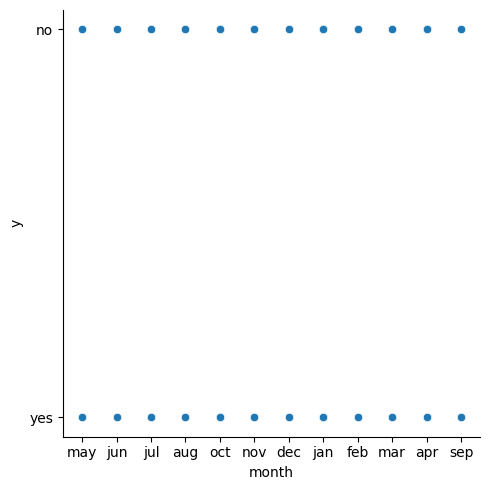

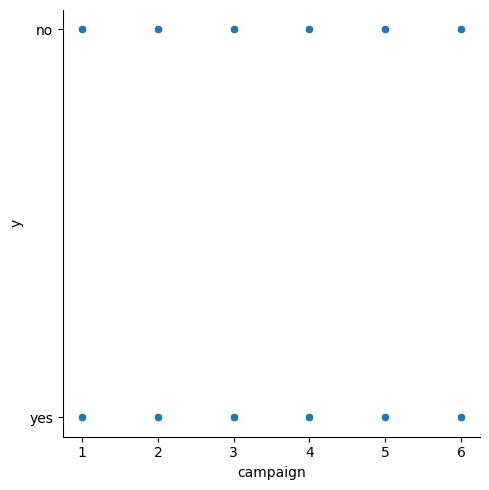

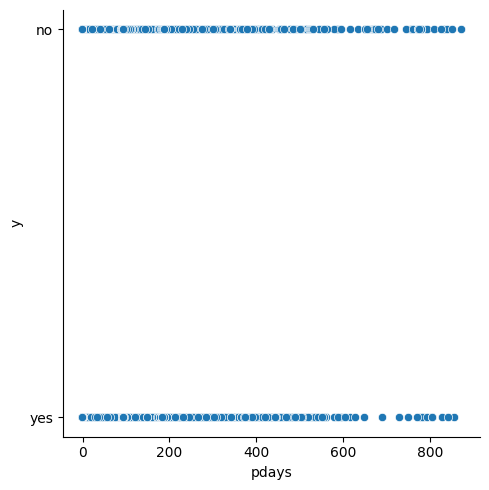

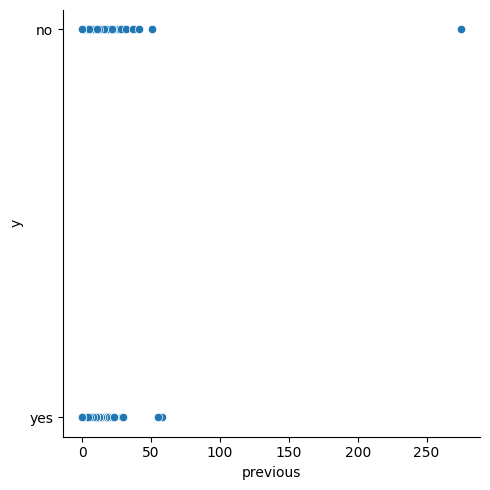

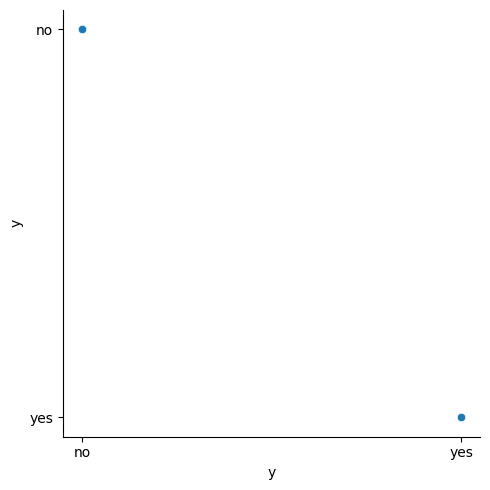

In [76]:
for column in numeric_columns:
    sns.relplot(data=df, x=column, y='y')

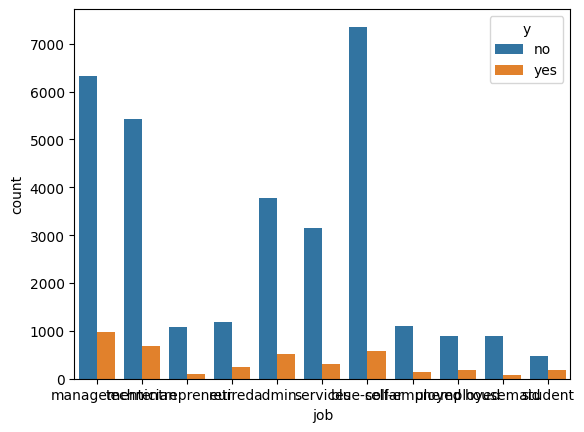

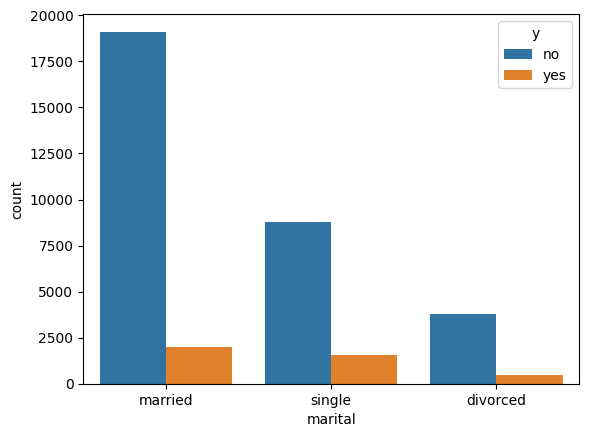

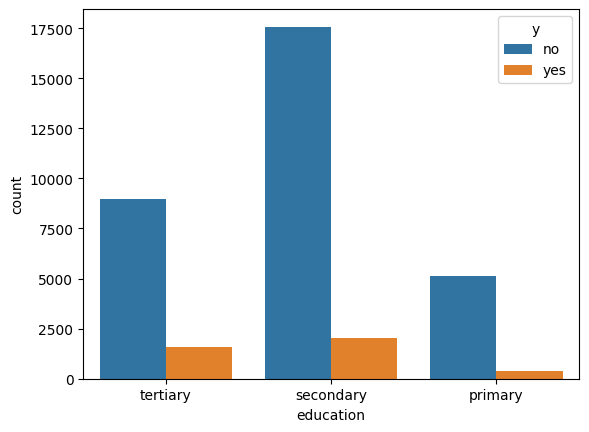

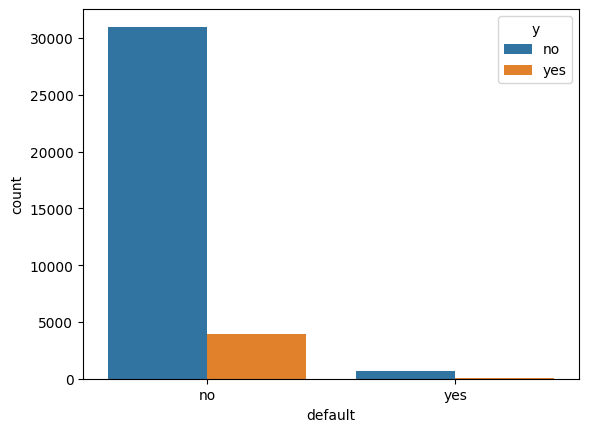

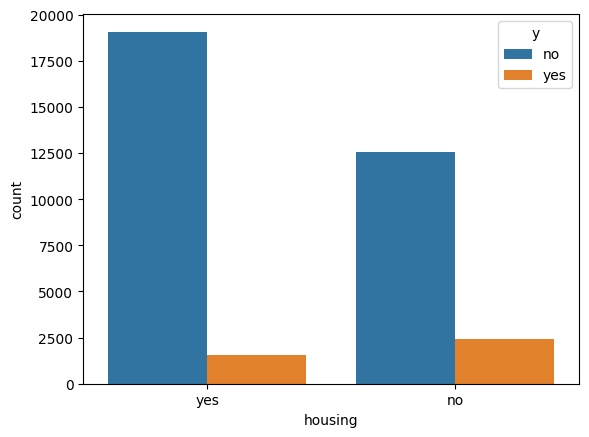

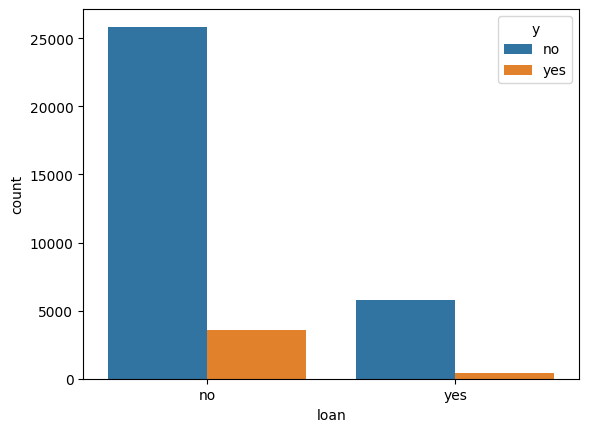

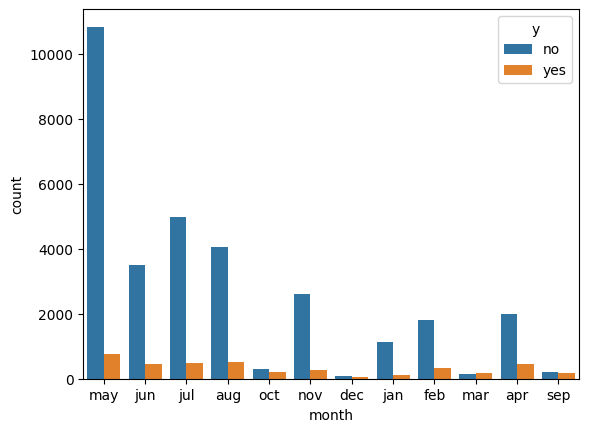

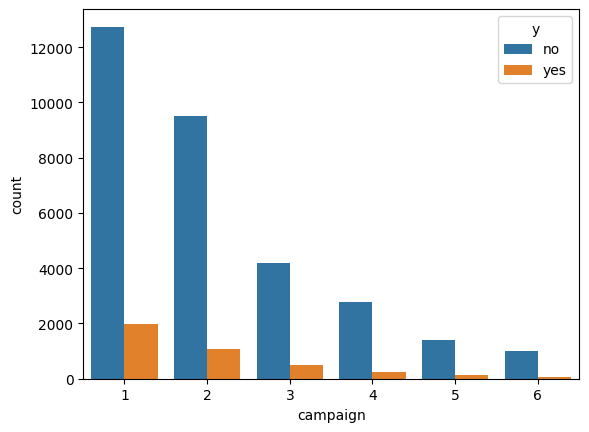

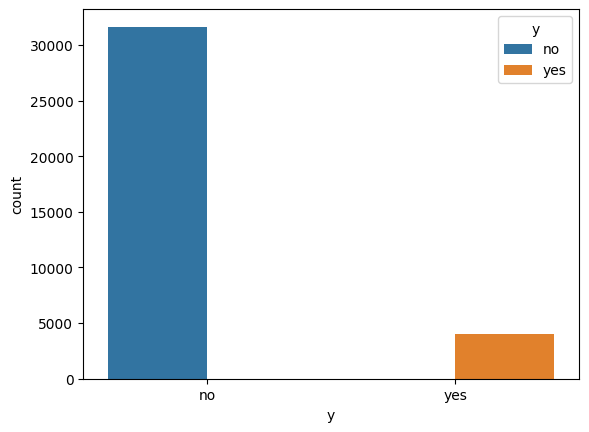

In [14]:
for column in df.columns:
    if df[column].nunique() < 15:
        plt.figure()
        sns.countplot(x=column, hue='y', data=df)

In [43]:
def one_hot_encode(df, column_name):
    if column_name in df.columns:
        df_encoded = pd.get_dummies(df[column_name], prefix=column_name, dtype=int)
        df.drop(column_name, axis=1, inplace=True)
        df = pd.concat([df, df_encoded], axis=1)
        print("One-hot encoding applied to column ", column_name, " successfully.")
        return df
    else:
        print(f"Column '{column_name}' not found in the DataFrame.")


df_encoded = df.replace(['yes', 'no'], [1, 0])
df_encoded.replace(['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec'], 
                   [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], inplace=True)
df_encoded = one_hot_encode(df_encoded, 'job')
df_encoded = one_hot_encode(df_encoded, 'education')
df_encoded = one_hot_encode(df_encoded, 'marital')
print(df_encoded)
df_max_scaled = df_encoded.copy()  
# apply normalization techniques 
for column in df_max_scaled.columns:
    try:
        df_max_scaled[column] = df_max_scaled[column]  / df_max_scaled[column].abs().max()
    except:
        raise Exception(f'Error by trying to scale column {column}. Values: {df_encoded[column].unique()}' )

print(df_encoded['y'].isna().sum(), df_max_scaled['y'].isna().sum(), df['y'].isna().sum())

One-hot encoding applied to column  job  successfully.
One-hot encoding applied to column  education  successfully.
One-hot encoding applied to column  marital  successfully.
       age  default  balance  housing  loan  day_of_week  month  campaign  \
0       58        0     2143        1     0            5      5         1   
1       44        0       29        1     0            5      5         1   
2       33        0        2        1     1            5      5         1   
5       35        0      231        1     0            5      5         1   
6       28        0      447        1     1            5      5         1   
...    ...      ...      ...      ...   ...          ...    ...       ...   
45203   23        0      113        0     0           17     11         1   
45205   25        0      505        0     1           17     11         2   
45206   51        0      825        0     0           17     11         3   
45209   57        0      668        0     0           1

In [59]:
dim_red = PCA()
x_pca = dim_red.fit_transform(df_max_scaled.drop('y', axis=1))
print(x_pca.shape)
print(dim_red.components_)
print(x_pca.shape)

(35651, 27)
[[-1.33039902e-02 -2.01916086e-03  2.70376674e-02 -1.81100669e-01
  -5.39356171e-02  7.30061158e-03  2.71763361e-02  3.65331191e-03
  -4.42327604e-03  1.87502480e-04 -8.27694652e-02 -2.17812337e-01
   9.96056717e-03  8.38961311e-05  4.04772816e-01 -6.90954231e-03
   1.79049809e-02 -8.25572317e-02  8.07686594e-03 -4.89783520e-02
  -1.77219826e-03 -2.55551293e-02 -5.59422887e-01  5.84978016e-01
   1.44950607e-02 -2.05427480e-01  1.90932419e-01]
 [-8.06080108e-02  2.69889922e-03 -1.49414225e-02 -1.42731596e-02
  -1.66606016e-02  1.73543644e-04 -2.27543425e-02 -2.21406068e-02
   6.43054666e-03  1.80111352e-04  9.78688229e-02 -1.52593316e-01
  -1.51552603e-02 -2.15744305e-02 -9.78433096e-02 -3.01391979e-02
  -5.50898011e-03  5.38601898e-02  3.78410518e-02  1.28073422e-01
   5.17100785e-03 -2.28165947e-01  3.17211692e-01 -8.90457442e-02
   9.51154711e-02 -6.61042048e-01  5.65926577e-01]
 [-4.54143639e-02  5.84666017e-05 -2.27017548e-02  5.35532702e-01
  -3.62131082e-02 -2.6172958

In [61]:
print(dim_red.explained_variance_ratio_)
print(dim_red.get_feature_names_out())
print(df_encoded['y'].isna().sum(), df_max_scaled['y'].isna().sum(), df['y'].isna().sum())
print(x_pca.shape)

[1.88271184e-01 1.58842581e-01 1.02587931e-01 8.70919887e-02
 5.99500668e-02 5.90534021e-02 5.39549779e-02 4.71479274e-02
 4.05271831e-02 2.96173190e-02 2.75616479e-02 2.25706554e-02
 1.93787042e-02 1.75740309e-02 1.42867198e-02 1.38709490e-02
 1.27168899e-02 1.12052173e-02 1.00279434e-02 7.40201438e-03
 6.95307361e-03 5.07295301e-03 4.31214674e-03 2.24938159e-05
 8.74793907e-32 4.59055157e-32 1.95029515e-32]
['pca0' 'pca1' 'pca2' 'pca3' 'pca4' 'pca5' 'pca6' 'pca7' 'pca8' 'pca9'
 'pca10' 'pca11' 'pca12' 'pca13' 'pca14' 'pca15' 'pca16' 'pca17' 'pca18'
 'pca19' 'pca20' 'pca21' 'pca22' 'pca23' 'pca24' 'pca25' 'pca26']
0 0 0
(35651, 27)


In [62]:
training_features = ['pca0', 'pca1', 'pca2', 'pca3', 'pca4', 'pca5', 'pca6', 'pca7', 'pca8', 'pca9']
df_pca = pd.DataFrame(x_pca, columns=dim_red.get_feature_names_out())
print(df_pca.shape)
print(df_encoded['y'].isna().sum(), df_max_scaled['y'].isna().sum(), df['y'].isna().sum())


(35651, 27)
0 0 0


(35651, 10) (35651, 28)
       pca0      pca1      pca2      pca3      pca4      pca5      pca6  \
0  0.915889 -0.752454 -0.001042 -0.743014 -0.033052 -0.197518 -0.207831   
1 -0.300118  1.132136  0.110386 -0.289007 -0.589730  0.513958 -0.135477   
2 -0.689600 -0.241936 -0.177667 -0.532184  0.148956  0.014885  0.759010   
3  0.904997 -0.717534  0.026695 -0.768519 -0.038324 -0.195779 -0.146754   
4  1.250476  0.499882  0.470518 -0.607559  0.073479 -0.119987  0.909167   

       pca7      pca8      pca9    y  
0 -0.083925  0.007898  0.102988  0.0  
1  0.002466  0.013922  0.231211  0.0  
2  0.104120  0.088786 -0.109039  0.0  
3 -0.085161  0.016465  0.102310  0.0  
4 -0.069561  0.069227  0.193507  0.0  
All values in the DataFrame are numeric.
0    0.0
1    0.0
2    0.0
5    0.0
6    0.0
Name: y, dtype: float64


c:\Users\Mahmoud Hisham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:447: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


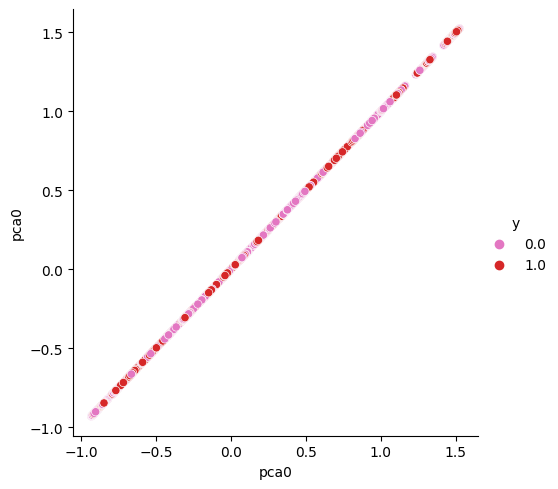

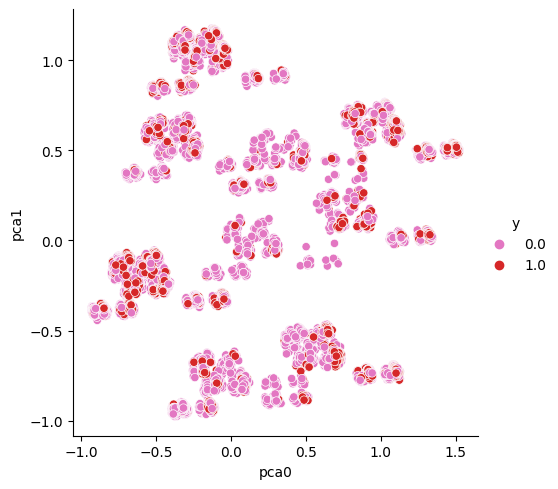

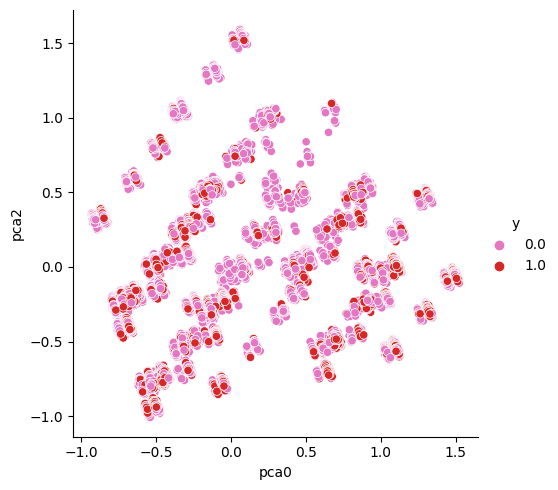

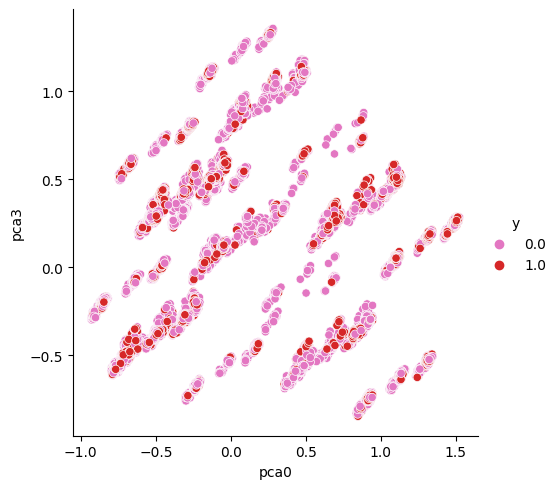

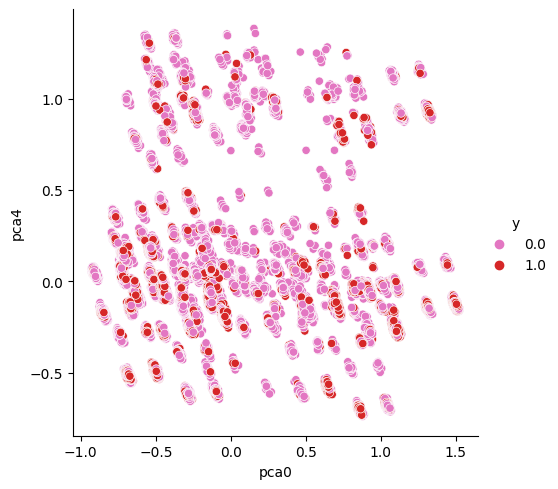

...

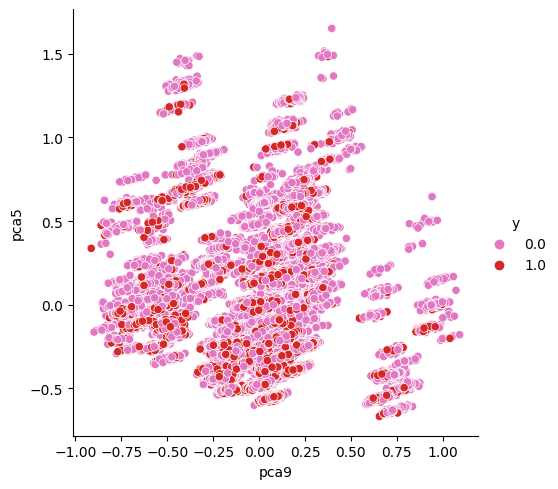

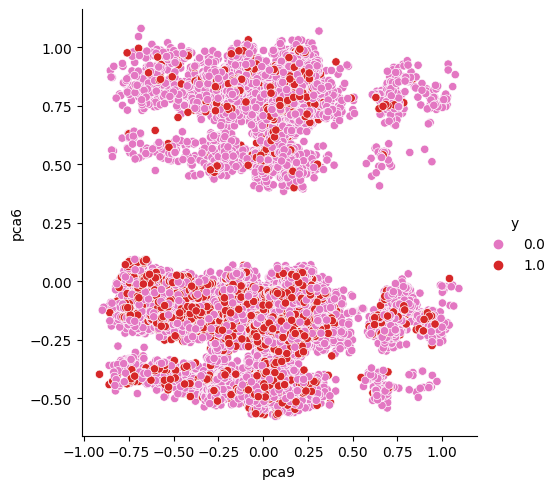

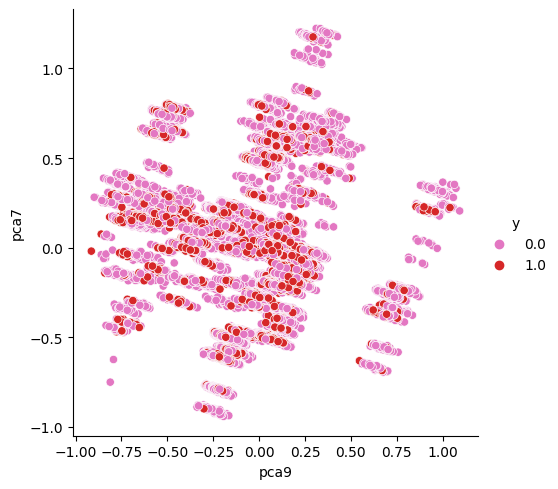

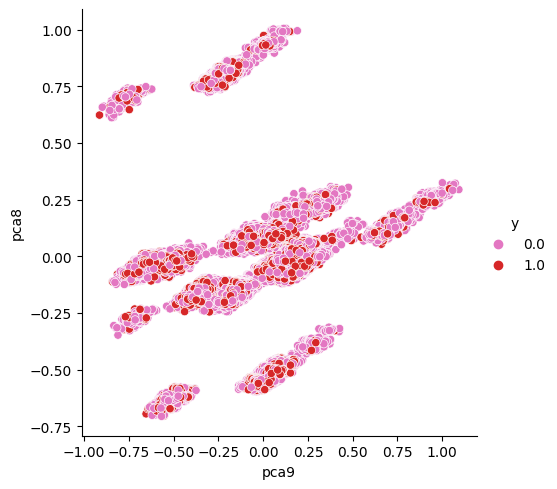

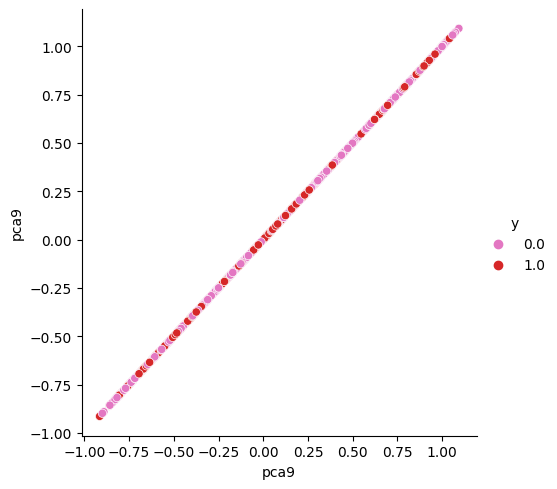

In [111]:
df_pca_working_set = df_pca[training_features]
df_pca_working_set = df_pca_working_set.reset_index(drop=True)
df_max_scaled_reset_index = df_max_scaled.reset_index(drop=True)
df_pca_working_set['y'] = df_max_scaled_reset_index['y']
non_numeric_values_exist = df_pca_working_set.isna().any().any()
if non_numeric_values_exist:
    print("There are non-numeric values in the DataFrame.")
else:
    print("All values in the DataFrame are numeric.")



In [ ]:
for column in training_features:
    for column_2 in training_features:
        sns.relplot(x=column, y=column_2, data=df_pca_working_set, hue='y', palette='tab10_r')

0 0 0
